##### top

# FMP modelling for Figure 2

This notebook runs Bayesian models on Datasets 1, 2, 3 and Concatenated Dataset 123 to assess interaction between perception and memory difficulty levels in the FMP. We fit the following formulas to mean score within the condition. Throughout the notebook, I use `task` as a term for memory difficulty levels (M, UD, FD-e), `difficulty` as a term for perceptual difficulty levels (1, 2, 3), and `userID` as a variable denoting individual participants. It is the exact same principle and code as the `FMP_fit_linear_regression-Figure2.ipynb` but it sets the FM as a reference level instead of UD.

* Model task (memory level) and difficulty (perceptual level) interaction with user (participant) as a random effect. Equation:
    * _correct_flt ~ task * difficulty + (1|userID)_
* Model task and difficulty as main effects without interaction with user as a random effect. Equation:
    * _correct_flt ~ task + difficulty + (1|userID)_

The datasets bear the same names as in the article:
* `dataset_1`
* `dataset_2` - randomised stimuli matched for entropy
* `dataset_3` - randomising cue stimulus
* and a new dataset that is a concatenation of the three datasets above -> `concat_datasets_123`

---

* [Models](#Models)
* [Plot results](#Plot-results)
* [Compare all data](#Compare-all-data)
* [Save the inference](#Save-the-inference)

In [1]:
import os, sys
import pickle
from os.path import join as opj
import arviz as az
import bambi as bmb
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

az.style.use("arviz-darkgrid")
SEED = 7355608


# Importing module for functions
functions_modul =  "./functions"
sys.path.insert(0, functions_modul)

# import all processing and plotting functions
from bayesian_modelling_functions import fit_model, print_model

path_general = "../"
path_data = opj(path_general, "Data", "datasets")
path_inference_data = opj(path_general, "Data", "model_inference_data")


# set the numer of CPU
num_cpu = min(4, os.cpu_count()-1)
print(f'We will have {num_cpu} cores.\n')


path_dic = {
    'dataset_1' : opj(path_data, 'FMP_dataset_1.csv'),
    'dataset_2': opj(path_data, 'FMP_dataset_2.csv'),
    'dataset_3': opj(path_data, 'FMP_dataset_3.csv'),
    'concat_datasets_123': opj(path_data, 'FMP_concat_datasets_123.csv'),
#     'dataset_4': opj(path_data, 'FMP_dataset_4.csv'),
}


#####
# rename the levels
rename_tasks_dic = {'perception':'Matching', 'perc':'Matching', 'blank':'Unfilled Delay', 'faces':'Filled Delay - emotions', 'math':'Filled Delay - math'}

# define orders
hue_order = ['Matching', 'Unfilled Delay', 'Filled Delay - emotions']
hue_order_math = ['Matching', 'Unfilled Delay', 'Filled Delay - emotions', 'Filled Delay - math']


# load all dataframes
df_dic = {}

# only selected cols
select_cols = ['stim1', 'stim2', 'target', 'RT', 'userID', 'difficulty', 'levels', 'task', 'correct_flt', 'order']


for f in path_dic.keys():   
    if 'longitudinal_' in f or f=='dataset_3':
        df_dic[f] = pd.read_csv(path_dic[f], usecols=select_cols+['target_loc', 'target_loc_simple'])
    else:
        df_dic[f] = pd.read_csv(path_dic[f], usecols=select_cols)
    
    df_dic[f]["Experiment"] = f
    
    # rename the memory task labels in the df
    df_dic[f]['task'] = df_dic[f]['task'].map(rename_tasks_dic).fillna(df_dic[f]['task'])
        

    # clean
    df_dic[f].reset_index(drop=True, inplace=True)
    
    if 'Unnamed: 0' in df_dic[f].columns:
        df_dic[f].drop('Unnamed: 0', inplace=True, axis=1)
        
    
    # find low performing participants - just a check, there should not be any
    tt = df_dic[f].loc[df_dic[f]['task'].isin(['face matching', 'perc', 'perception'])].groupby(['userID', 'difficulty']).correct_flt.mean()

    drop_ptc = tt[tt<=0.5].reset_index().userID.values
    print(f'\nIn {f} dropping {len(drop_ptc)} participants for low accuracy in FM.')
    print(tt[tt<=0.5])

    # and remove them
    df_dic[f] = df_dic[f].loc[~df_dic[f]['userID'].isin(drop_ptc)]
    # clean up
    drop_ptc, tt = None, None


We will have 4 cores.


In dataset_1 dropping 0 participants for low accuracy in FM.
Series([], Name: correct_flt, dtype: float64)

In dataset_2 dropping 0 participants for low accuracy in FM.
Series([], Name: correct_flt, dtype: float64)

In dataset_3 dropping 0 participants for low accuracy in FM.
Series([], Name: correct_flt, dtype: float64)

In concat_datasets_123 dropping 0 participants for low accuracy in FM.
Series([], Name: correct_flt, dtype: float64)


In [2]:
# select only specific datasets and prepare them
datasets2fit = ['dataset_1', 'dataset_2', 'dataset_3', 'concat_datasets_123']

df_dic_fit = {}


for f in datasets2fit:
    data=None
    
    # groupby and make means for ptc and condition
    data = df_dic[f].groupby(['userID', 'task', 'difficulty'], observed=False).correct_flt.mean().reset_index()

    # convert all variables to categories
    # categorical_cols = data.columns[data.dtypes == object].tolist() + ['difficulty']
    categorical_cols = ['userID', 'task', 'difficulty']
    for col in categorical_cols:
        if col == 'task':
            # specify the order that we want
            data[col] = pd.Categorical(data[col], categories=['Unfilled Delay', 'Matching', 'Filled Delay - emotions'], ordered=True)
            #['Unfilled Delay', 'Matching', 'Filled Delay - emotions']
            
            # also do it for the original datasets
            df_dic[f][col] = pd.Categorical(df_dic[f][col], categories=['Unfilled Delay', 'Matching', 'Filled Delay - emotions'], ordered=True)
        else:
            data[col] = data[col].astype("category")
            df_dic[f][col] = df_dic[f][col].astype("category")

    # check
    print('\n',f)
    df_dic[f].info()
        
    # save
    df_dic_fit[f] = data.copy()

# # drop them for now
# data[data.correct_flt.isna()]


 dataset_1
<class 'pandas.core.frame.DataFrame'>
Index: 46620 entries, 0 to 46619
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   stim1        46620 non-null  object  
 1   stim2        46620 non-null  object  
 2   target       46620 non-null  object  
 3   RT           45500 non-null  float64 
 4   userID       46620 non-null  category
 5   task         46620 non-null  category
 6   order        46620 non-null  int64   
 7   difficulty   46620 non-null  category
 8   levels       46620 non-null  int64   
 9   correct_flt  45500 non-null  float64 
 10  Experiment   46620 non-null  object  
dtypes: category(3), float64(2), int64(2), object(4)
memory usage: 3.4+ MB

 dataset_2
<class 'pandas.core.frame.DataFrame'>
Index: 27540 entries, 0 to 27539
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   userID       27540 non-null  category
 1   

## Model as means
[top](#top)

In [3]:
model_assumptions = {
    "correct_flt ~ task * difficulty + (1|userID)": "Each user has their own baseline performance, but the effect of task and difficulty is assumed to be the same across all users.",
    "correct_flt ~ task + difficulty + (1|userID)": "Assumes that each user has their own baseline performance, but the effects of task and difficulty are consistent across all users without any interaction between task and difficulty.",
}

# define what we want to run
base_lvl = ['Matching', 'Unfilled Delay', 'Filled Delay - emotions']
formulas2run = [
    "correct_flt ~ C(task, levels=base_lvl) * difficulty + (1|userID)",
    "correct_flt ~ C(task, levels=base_lvl) + difficulty + (1|userID)",
]

In [4]:
# define where we will store the results
model_dic_bernoulli = {}
result_dic_bernoulli = {}

for f in df_dic_fit.keys():
    print(f'\nFitting dataset {f}\n')
    # create datasets
    if f not in model_dic_bernoulli.keys():
        model_dic_bernoulli[f] = {}
    if f not in result_dic_bernoulli.keys():
        result_dic_bernoulli[f] = {}
    
    for formula in formulas2run:
        print(f'\nFitting formula {formula}\n')
    
        model_dic_bernoulli[f][formula], result_dic_bernoulli[f][formula] = fit_model(formula, df_dic_fit[f], categorical_cols, 
                                                                                      num_cpu=num_cpu, base_lvl=base_lvl,
                                                                                      check_priors=False, sample_priors=False)
        

Sampling 4 chains, 0 divergences ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00 / 0:00:28

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 28 seconds.


### check priors

Sampling: [1|userID_sigma, C(task, levels=base_lvl), C(task, levels=base_lvl):difficulty, Intercept, difficulty, sigma]


array([[<Axes: title={'center': 'Intercept'}>,
        <Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'C(task, levels=base_lvl)\nUnfilled Delay'}>],
       [<Axes: title={'center': 'C(task, levels=base_lvl)\nFilled Delay - emotions'}>,
        <Axes: title={'center': 'difficulty\n2'}>,
        <Axes: title={'center': 'difficulty\n3'}>],
       [<Axes: title={'center': 'C(task, levels=base_lvl):difficulty\nUnfilled Delay, 2'}>,
        <Axes: title={'center': 'C(task, levels=base_lvl):difficulty\nUnfilled Delay, 3'}>,
        <Axes: title={'center': 'C(task, levels=base_lvl):difficulty\nFilled Delay - emotions, 2'}>],
       [<Axes: title={'center': 'C(task, levels=base_lvl):difficulty\nFilled Delay - emotions, 3'}>,
        <Axes: title={'center': '1|userID_sigma'}>, <Axes: >]],
      dtype=object)

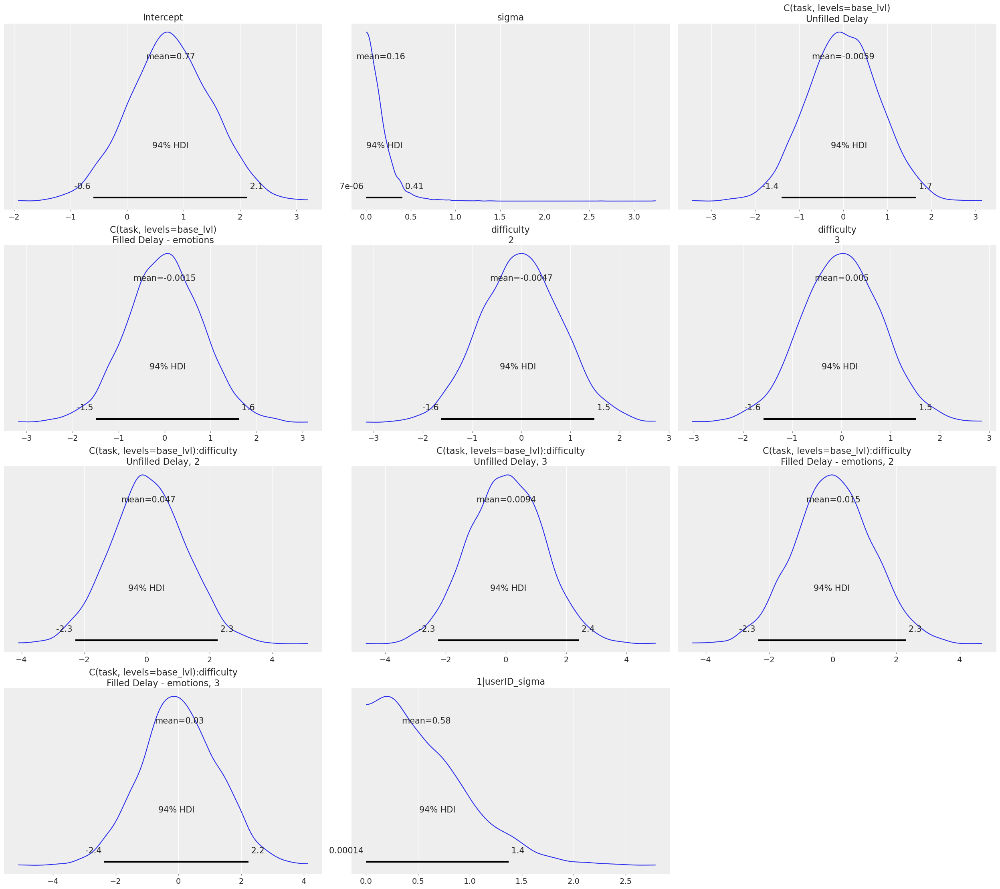

In [5]:
model_dic_bernoulli[f][formulas2run[0]].plot_priors()

Sampling: [1|userID_sigma, C(task, levels=base_lvl), Intercept, difficulty, sigma]


array([[<Axes: title={'center': 'Intercept'}>,
        <Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'C(task, levels=base_lvl)\nUnfilled Delay'}>],
       [<Axes: title={'center': 'C(task, levels=base_lvl)\nFilled Delay - emotions'}>,
        <Axes: title={'center': 'difficulty\n2'}>,
        <Axes: title={'center': 'difficulty\n3'}>],
       [<Axes: title={'center': '1|userID_sigma'}>, <Axes: >, <Axes: >]],
      dtype=object)

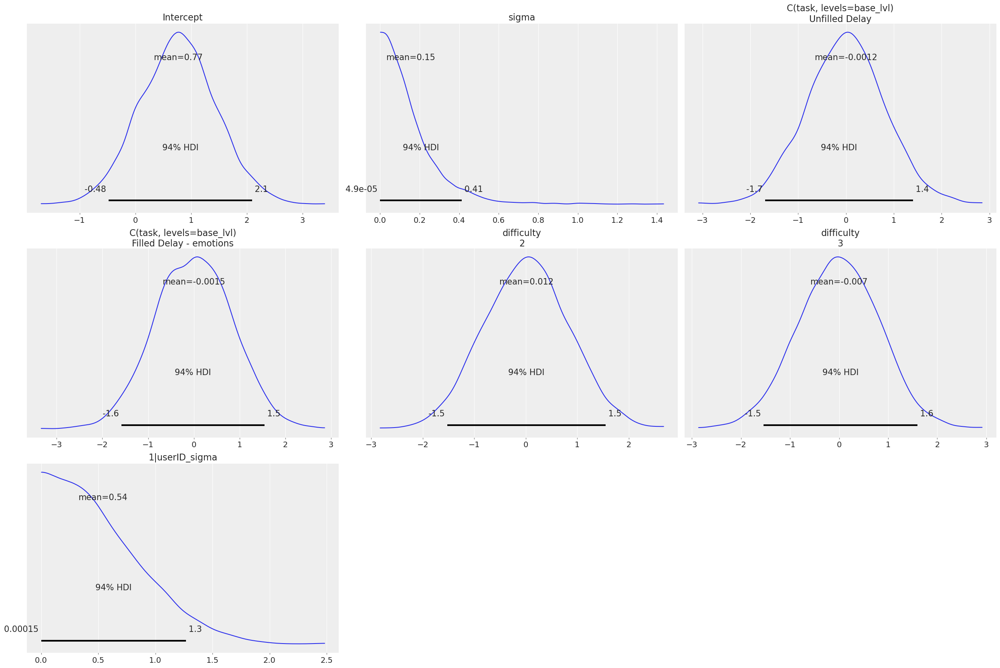

In [6]:
model_dic_bernoulli[f][formulas2run[1]].plot_priors()

### check posterior

array([[<Axes: title={'center': 'Intercept'}>,
        <Axes: title={'center': 'difficulty\n2'}>,
        <Axes: title={'center': 'difficulty\n3'}>],
       [<Axes: title={'center': 'C(task, levels=base_lvl)\nUnfilled Delay'}>,
        <Axes: title={'center': 'C(task, levels=base_lvl)\nFilled Delay - emotions'}>,
        <Axes: >]], dtype=object)

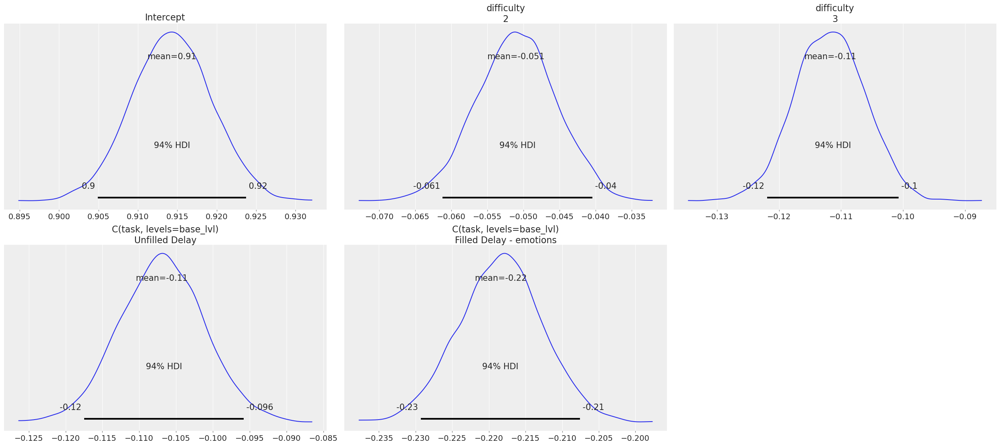

In [7]:
az.plot_posterior(result_dic_bernoulli[f][formulas2run[0]], 
                  var_names=['Intercept', 'difficulty', 'C(task, levels=base_lvl)'],#, 'task:difficulty'],
                  hdi_prob=.94)

array([[<Axes: title={'center': 'Intercept'}>,
        <Axes: title={'center': 'difficulty\n2'}>,
        <Axes: title={'center': 'difficulty\n3'}>],
       [<Axes: title={'center': 'C(task, levels=base_lvl)\nUnfilled Delay'}>,
        <Axes: title={'center': 'C(task, levels=base_lvl)\nFilled Delay - emotions'}>,
        <Axes: >]], dtype=object)

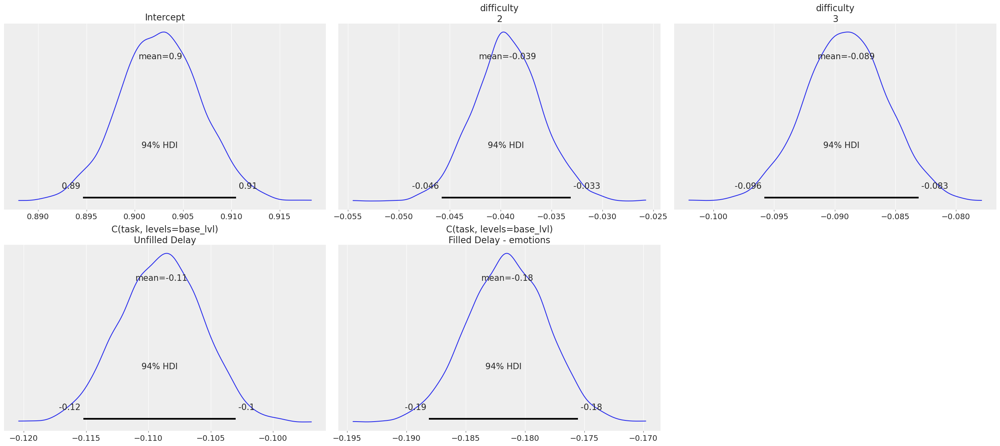

In [8]:
az.plot_posterior(result_dic_bernoulli[f][formulas2run[1]], 
                  var_names=['Intercept', 'difficulty', 'C(task, levels=base_lvl)'],#, 'task:difficulty'],
                  hdi_prob=.94)

---
## Plot results

## FMP dataset 1
[top](#top)


Dataset: dataset_1

Fitting formula correct_flt ~ C(task, levels=base_lvl) * difficulty + (1|userID)



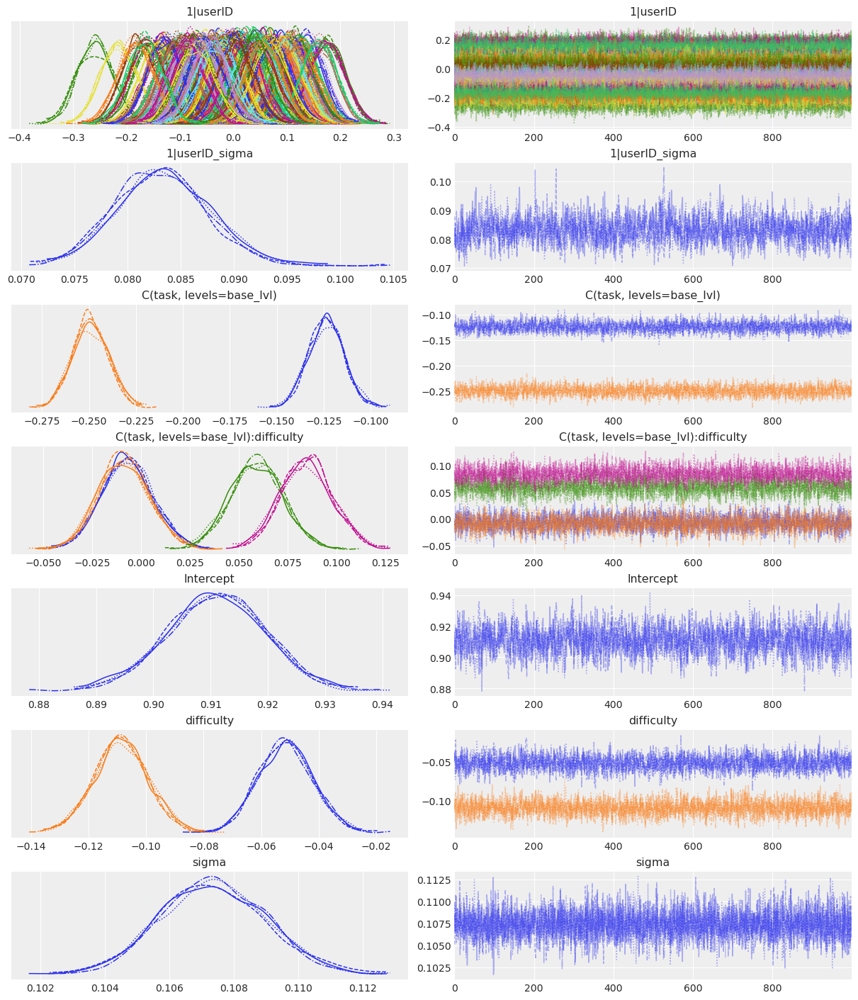

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1]     0.083  0.033   0.024    0.145        0.0    0.000    7998.0   
1|userID[s_10]    0.117  0.033   0.054    0.179        0.0    0.000    8487.0   
1|userID[s_1000]  0.023  0.035  -0.040    0.088        0.0    0.001    8673.0   
1|userID[s_1004]  0.093  0.033   0.029    0.154        0.0    0.000    9301.0   
1|userID[s_1005]  0.096  0.033   0.033    0.158        0.0    0.000    8587.0   
1|userID[s_1014] -0.015  0.033  -0.078    0.050        0.0    0.001    8561.0   
1|userID[s_1021]  0.080  0.032   0.017    0.137        0.0    0.000    9153.0   
1|userID[s_1025]  0.126  0.033   0.063    0.188        0.0    0.000    7816.0   
1|userID[s_1027]  0.005  0.033  -0.054    0.068        0.0    0.001    7967.0   
1|userID[s_103]   0.101  0.032   0.042    0.163        0.0    0.000    8733.0   
1|userID[s_1032] -0.023  0.032  -0.086    0.034        0.0    0.000    8299.0   
1|userID[s_1033]  0.088  0.0

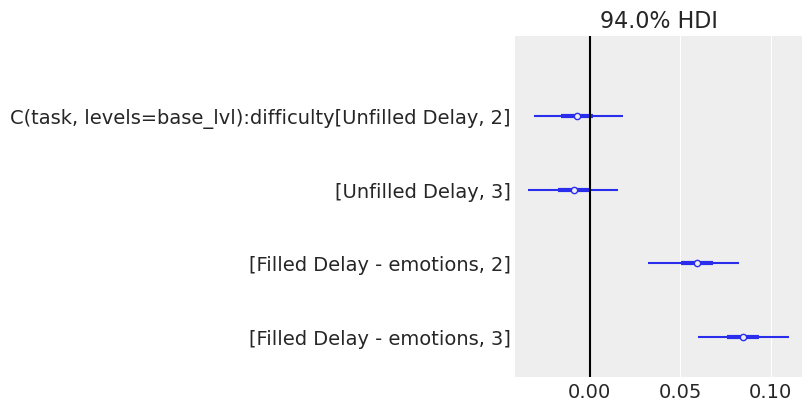

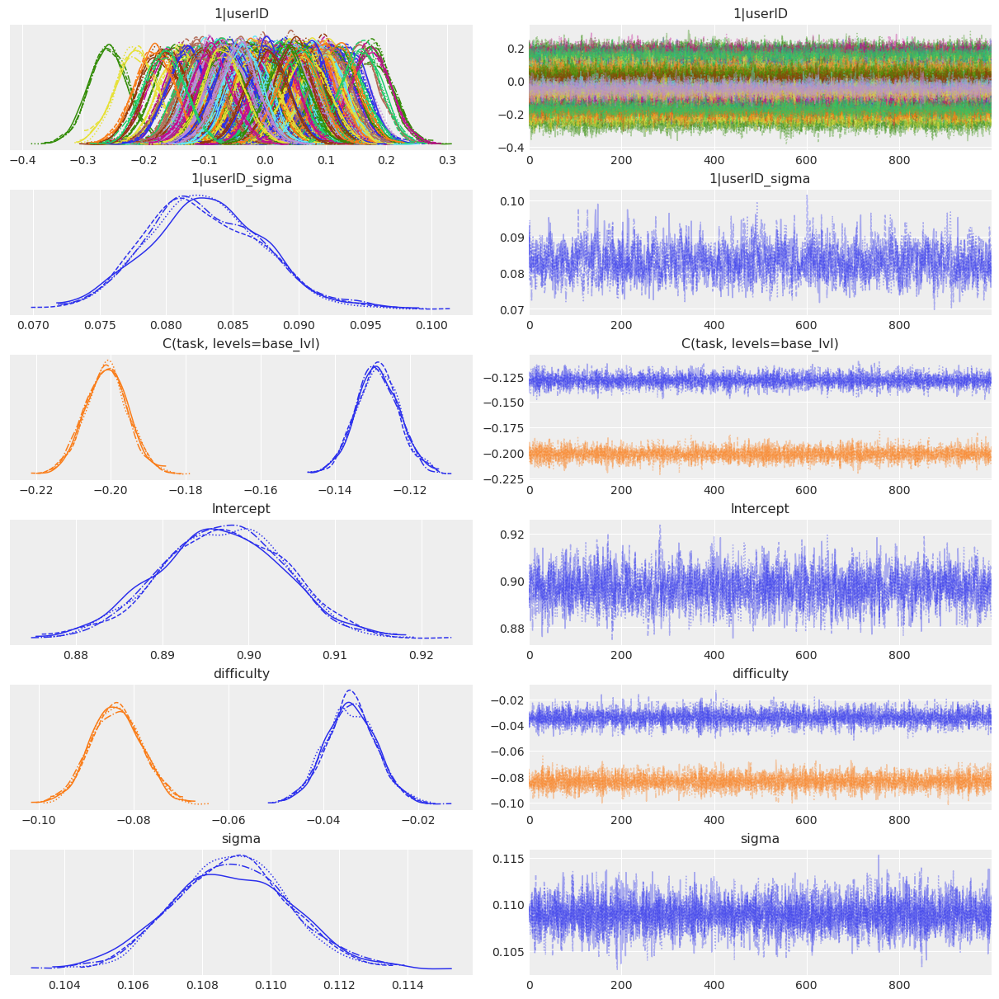

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1]     0.082  0.034   0.019    0.146        0.0    0.000    8179.0   
1|userID[s_10]    0.116  0.034   0.054    0.183        0.0    0.000    6620.0   
1|userID[s_1000]  0.023  0.033  -0.037    0.089        0.0    0.000    8171.0   
1|userID[s_1004]  0.093  0.034   0.025    0.155        0.0    0.000    7815.0   
1|userID[s_1005]  0.096  0.033   0.032    0.156        0.0    0.000    7127.0   
1|userID[s_1014] -0.014  0.034  -0.083    0.045        0.0    0.001    7997.0   
1|userID[s_1021]  0.078  0.032   0.019    0.139        0.0    0.000    7052.0   
1|userID[s_1025]  0.125  0.034   0.060    0.189        0.0    0.000    7021.0   
1|userID[s_1027]  0.005  0.034  -0.059    0.068        0.0    0.001    7931.0   
1|userID[s_103]   0.100  0.034   0.038    0.167        0.0    0.000    8249.0   
1|userID[s_1032] -0.023  0.034  -0.089    0.039        0.0    0.000    7162.0   
1|userID[s_1033]  0.087  0.0

In [9]:
f = 'dataset_1'
print(f'Dataset: {f}')
for formula in formulas2run:
    print(f'\nFitting formula {formula}\n')
    print_model(model_dic_bernoulli[f][formula], result_dic_bernoulli[f][formula])

## FMP dataset 2 -- randomised stimuli matched for entropy
[top](#top)


Dataset: dataset_2

Fitting formula correct_flt ~ C(task, levels=base_lvl) * difficulty + (1|userID)



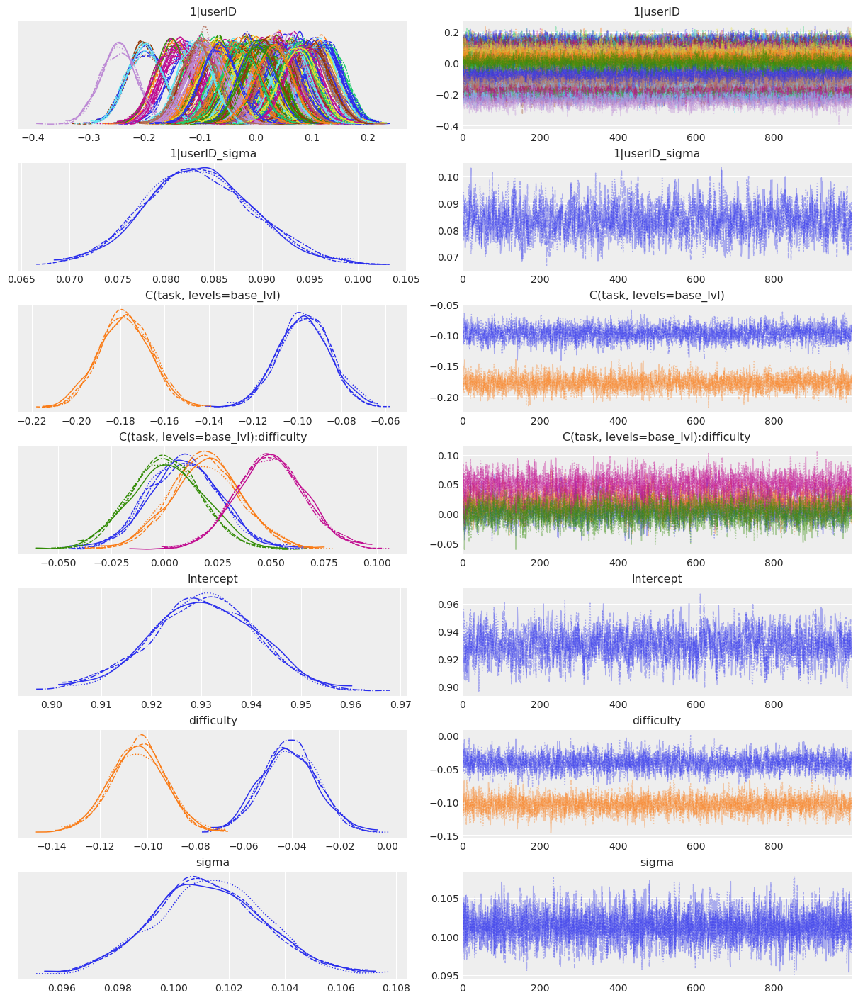

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1013]  0.120  0.032   0.060    0.179        0.0    0.000    6870.0   
1|userID[s_1022]  0.115  0.032   0.058    0.176        0.0    0.000    6238.0   
1|userID[s_1026] -0.066  0.032  -0.130   -0.011        0.0    0.000    6943.0   
1|userID[s_104]  -0.135  0.031  -0.196   -0.078        0.0    0.000    6921.0   
1|userID[s_1044]  0.061  0.032   0.001    0.121        0.0    0.000    6457.0   
1|userID[s_1048] -0.001  0.032  -0.062    0.057        0.0    0.001    7228.0   
1|userID[s_105]   0.016  0.032  -0.040    0.076        0.0    0.000    6753.0   
1|userID[s_1081] -0.071  0.032  -0.131   -0.013        0.0    0.000    6156.0   
1|userID[s_1083] -0.139  0.032  -0.193   -0.076        0.0    0.000    6731.0   
1|userID[s_1103]  0.023  0.032  -0.034    0.085        0.0    0.000    6939.0   
1|userID[s_1105] -0.124  0.032  -0.186   -0.064        0.0    0.000    7170.0   
1|userID[s_1120]  0.104  0.0

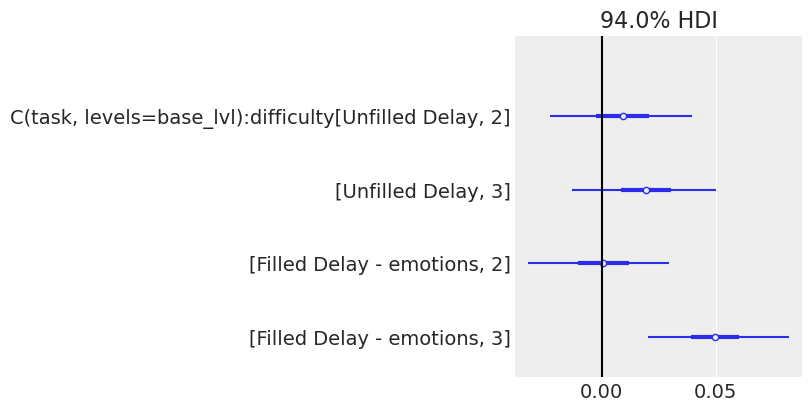

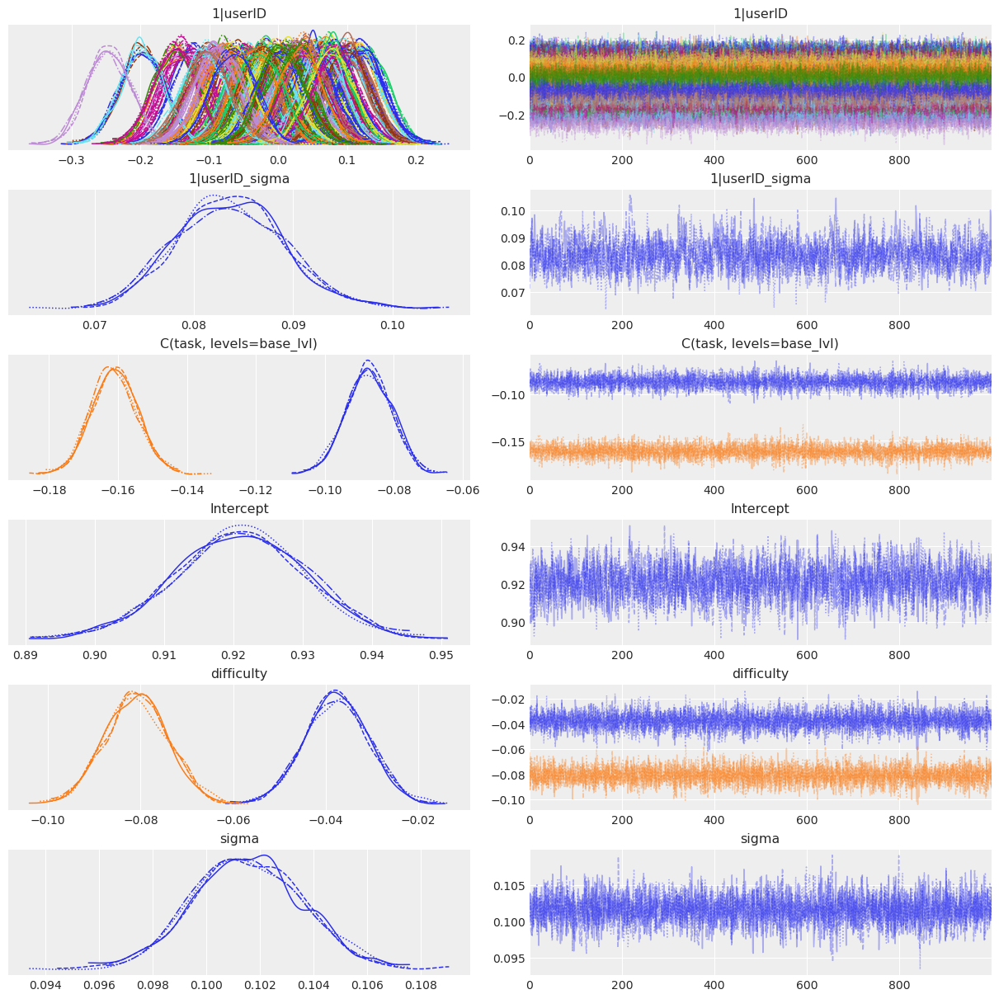

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1013]  0.120  0.032   0.062    0.182        0.0    0.000    5362.0   
1|userID[s_1022]  0.116  0.032   0.057    0.176        0.0    0.000    6497.0   
1|userID[s_1026] -0.067  0.033  -0.128   -0.007        0.0    0.000    5629.0   
1|userID[s_104]  -0.135  0.031  -0.191   -0.073        0.0    0.000    5128.0   
1|userID[s_1044]  0.062  0.032   0.004    0.120        0.0    0.000    6869.0   
1|userID[s_1048] -0.001  0.032  -0.061    0.060        0.0    0.001    7084.0   
1|userID[s_105]   0.017  0.031  -0.040    0.078        0.0    0.000    5673.0   
1|userID[s_1081] -0.071  0.032  -0.127   -0.006        0.0    0.000    5391.0   
1|userID[s_1083] -0.138  0.032  -0.194   -0.077        0.0    0.000    5880.0   
1|userID[s_1103]  0.024  0.032  -0.037    0.083        0.0    0.000    6082.0   
1|userID[s_1105] -0.123  0.032  -0.187   -0.068        0.0    0.000    5757.0   
1|userID[s_1120]  0.104  0.0

In [10]:
f = 'dataset_2'
print(f'Dataset: {f}')
for formula in formulas2run:
    print(f'\nFitting formula {formula}\n')
    print_model(model_dic_bernoulli[f][formula], result_dic_bernoulli[f][formula])

## FMP dataset 3 -- randomising cue stimulus 
[top](#top)

Dataset: dataset_3

Fitting formula correct_flt ~ C(task, levels=base_lvl) * difficulty + (1|userID)



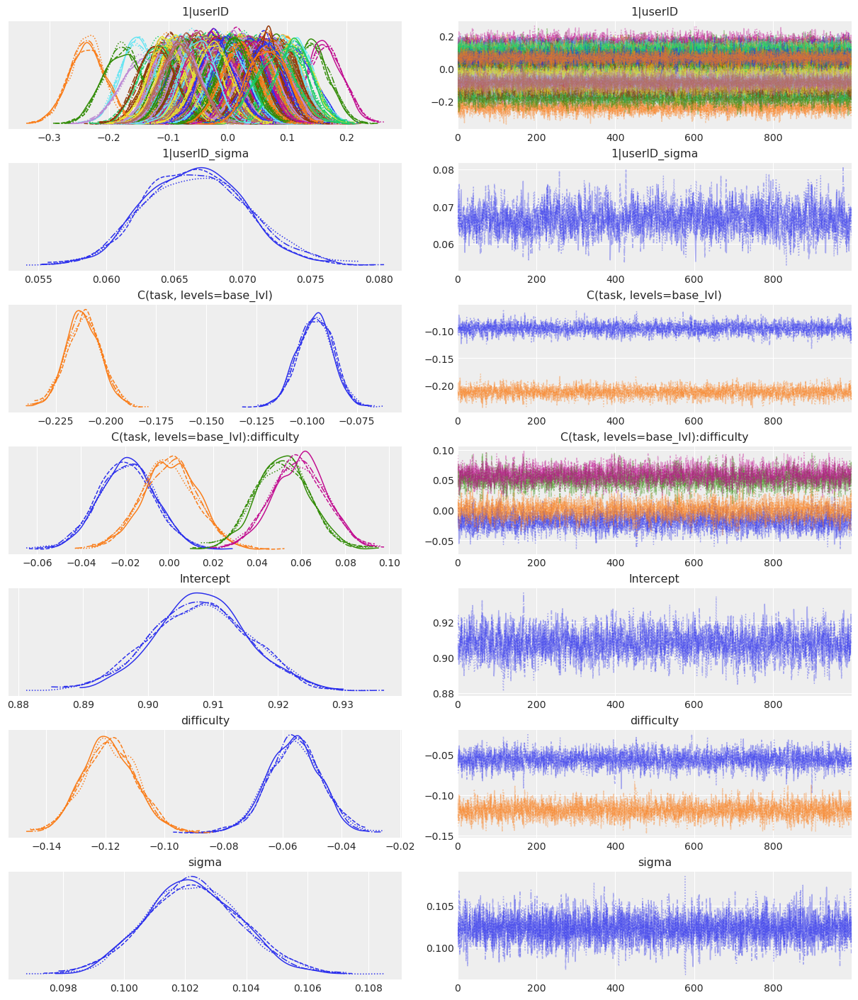

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1001]  0.023  0.030  -0.035    0.078        0.0    0.000    9097.0   
1|userID[s_1002] -0.094  0.031  -0.150   -0.035        0.0    0.000    8991.0   
1|userID[s_1006]  0.031  0.031  -0.024    0.092        0.0    0.000    7924.0   
1|userID[s_1012] -0.027  0.030  -0.082    0.030        0.0    0.000    8097.0   
1|userID[s_1015] -0.010  0.030  -0.066    0.047        0.0    0.001    8684.0   
1|userID[s_1016]  0.015  0.030  -0.045    0.071        0.0    0.000    9531.0   
1|userID[s_1017] -0.051  0.031  -0.108    0.010        0.0    0.000    9666.0   
1|userID[s_1036]  0.031  0.030  -0.025    0.088        0.0    0.000    7961.0   
1|userID[s_1042] -0.002  0.030  -0.060    0.053        0.0    0.001    9295.0   
1|userID[s_1045]  0.052  0.030  -0.006    0.109        0.0    0.000    6803.0   
1|userID[s_1046] -0.017  0.035  -0.085    0.045        0.0    0.001    8061.0   
1|userID[s_1047]  0.011  0.0

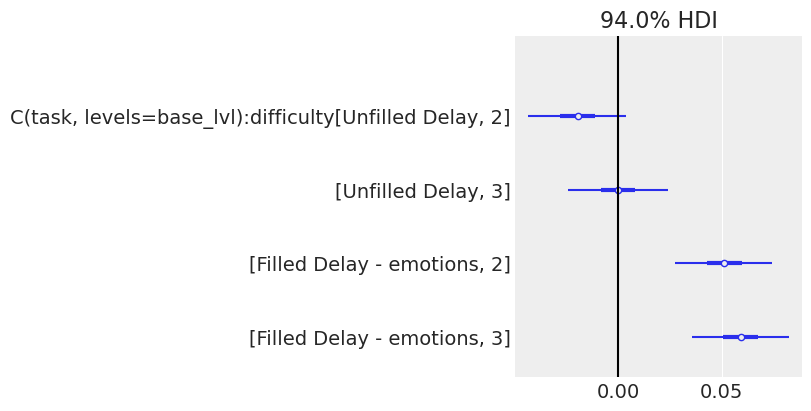

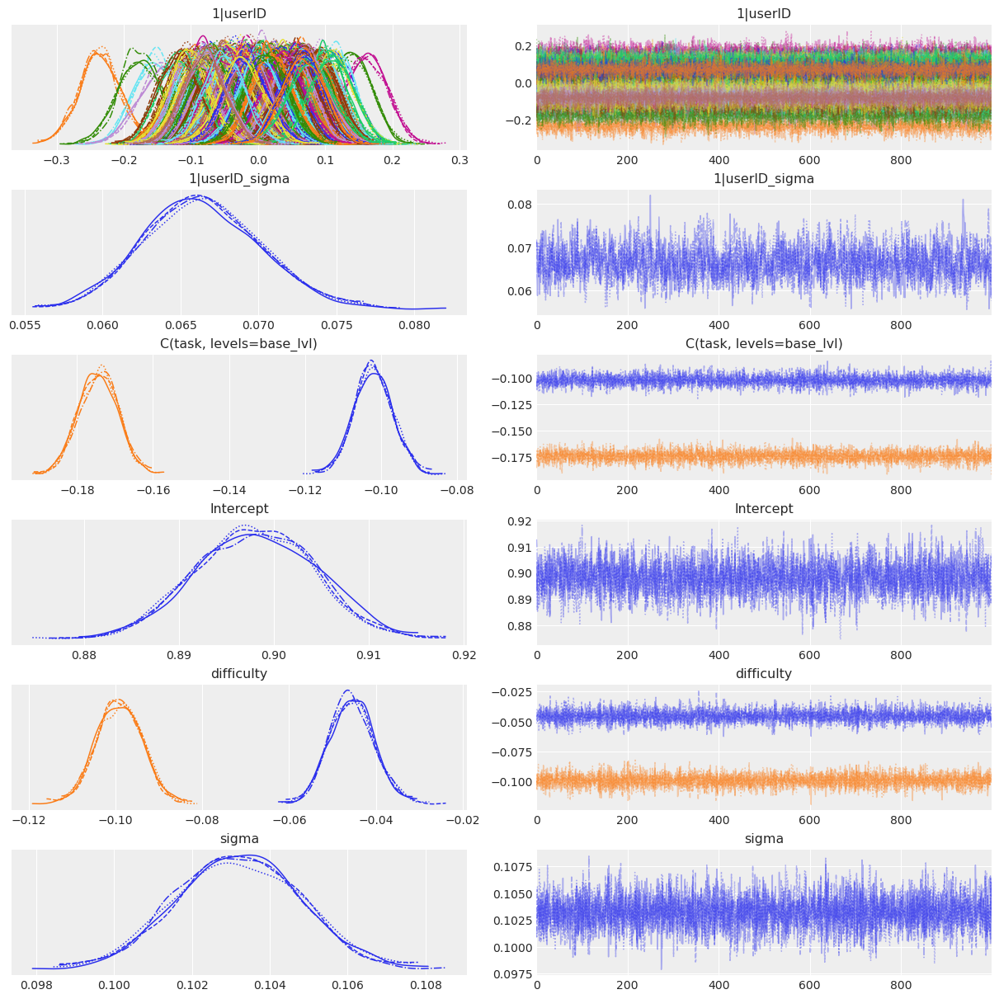

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1001]  0.023  0.030  -0.033    0.080        0.0    0.000    8691.0   
1|userID[s_1002] -0.094  0.031  -0.154   -0.039        0.0    0.000    7475.0   
1|userID[s_1006]  0.030  0.031  -0.024    0.092        0.0    0.000    7488.0   
1|userID[s_1012] -0.027  0.030  -0.080    0.032        0.0    0.000    7520.0   
1|userID[s_1015] -0.010  0.031  -0.068    0.047        0.0    0.001    8251.0   
1|userID[s_1016]  0.015  0.030  -0.045    0.068        0.0    0.000    7812.0   
1|userID[s_1017] -0.051  0.031  -0.106    0.007        0.0    0.000    7554.0   
1|userID[s_1036]  0.031  0.030  -0.024    0.087        0.0    0.000    6802.0   
1|userID[s_1042] -0.003  0.030  -0.058    0.055        0.0    0.001    8448.0   
1|userID[s_1045]  0.051  0.032  -0.006    0.114        0.0    0.000    8199.0   
1|userID[s_1046] -0.017  0.036  -0.082    0.054        0.0    0.001    8290.0   
1|userID[s_1047]  0.010  0.0

In [11]:
f = 'dataset_3'

print(f'Dataset: {f}')
for formula in formulas2run:
    print(f'\nFitting formula {formula}\n')
    print_model(model_dic_bernoulli[f][formula], result_dic_bernoulli[f][formula])

## FMP concatenated dataset 1, 2, 3
[top](#top)


Dataset: concat_datasets_123

Fitting formula correct_flt ~ C(task, levels=base_lvl) * difficulty + (1|userID)



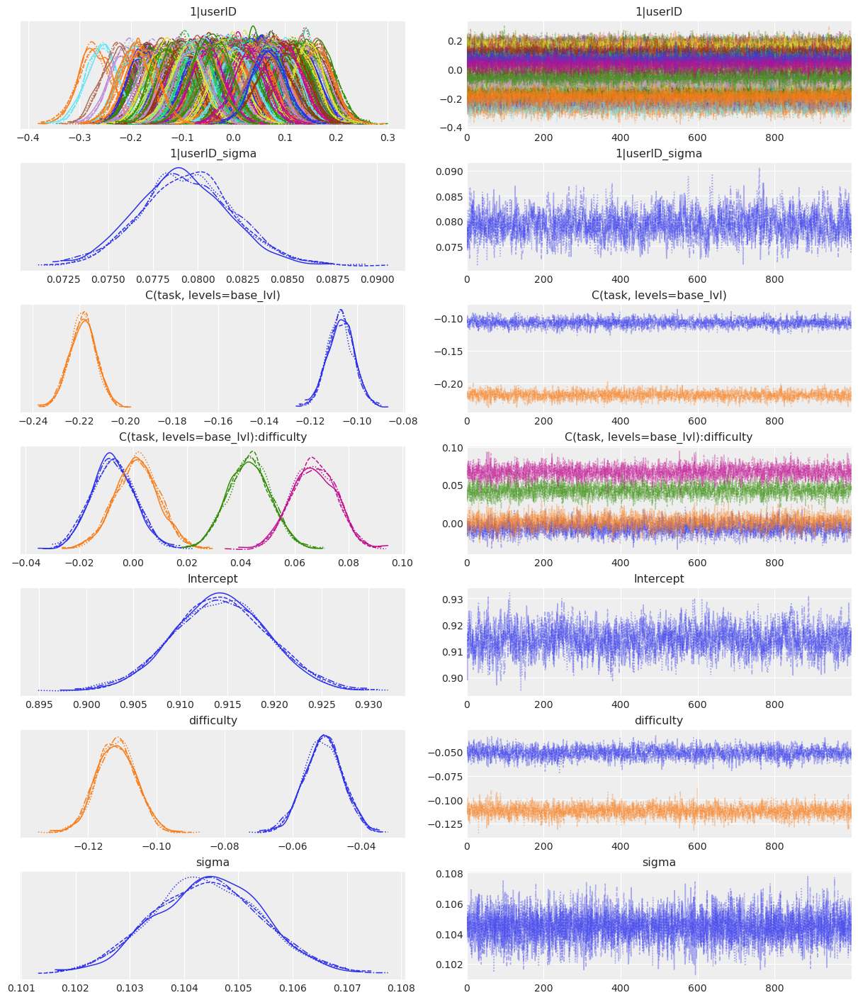

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1]     0.068  0.032   0.007    0.128        0.0    0.000    6917.0   
1|userID[s_10]    0.103  0.031   0.045    0.162        0.0    0.000    7814.0   
1|userID[s_1000]  0.009  0.031  -0.052    0.067        0.0    0.001    8219.0   
1|userID[s_1001]  0.020  0.032  -0.041    0.080        0.0    0.000    7935.0   
1|userID[s_1002] -0.104  0.033  -0.163   -0.042        0.0    0.000    7480.0   
1|userID[s_1004]  0.080  0.033   0.018    0.139        0.0    0.000    7244.0   
1|userID[s_1005]  0.083  0.032   0.017    0.140        0.0    0.000    8379.0   
1|userID[s_1006]  0.028  0.032  -0.031    0.088        0.0    0.000    6342.0   
1|userID[s_1012] -0.034  0.031  -0.094    0.024        0.0    0.000    7214.0   
1|userID[s_1013]  0.148  0.033   0.089    0.211        0.0    0.000    5992.0   
1|userID[s_1014] -0.027  0.033  -0.090    0.034        0.0    0.000    7200.0   
1|userID[s_1015] -0.015  0.0

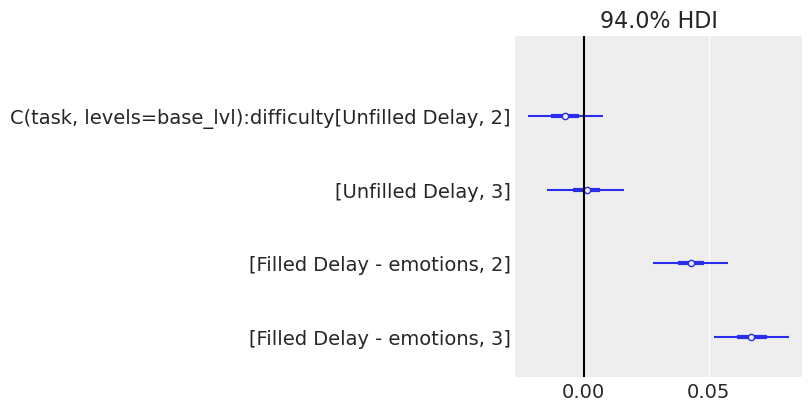

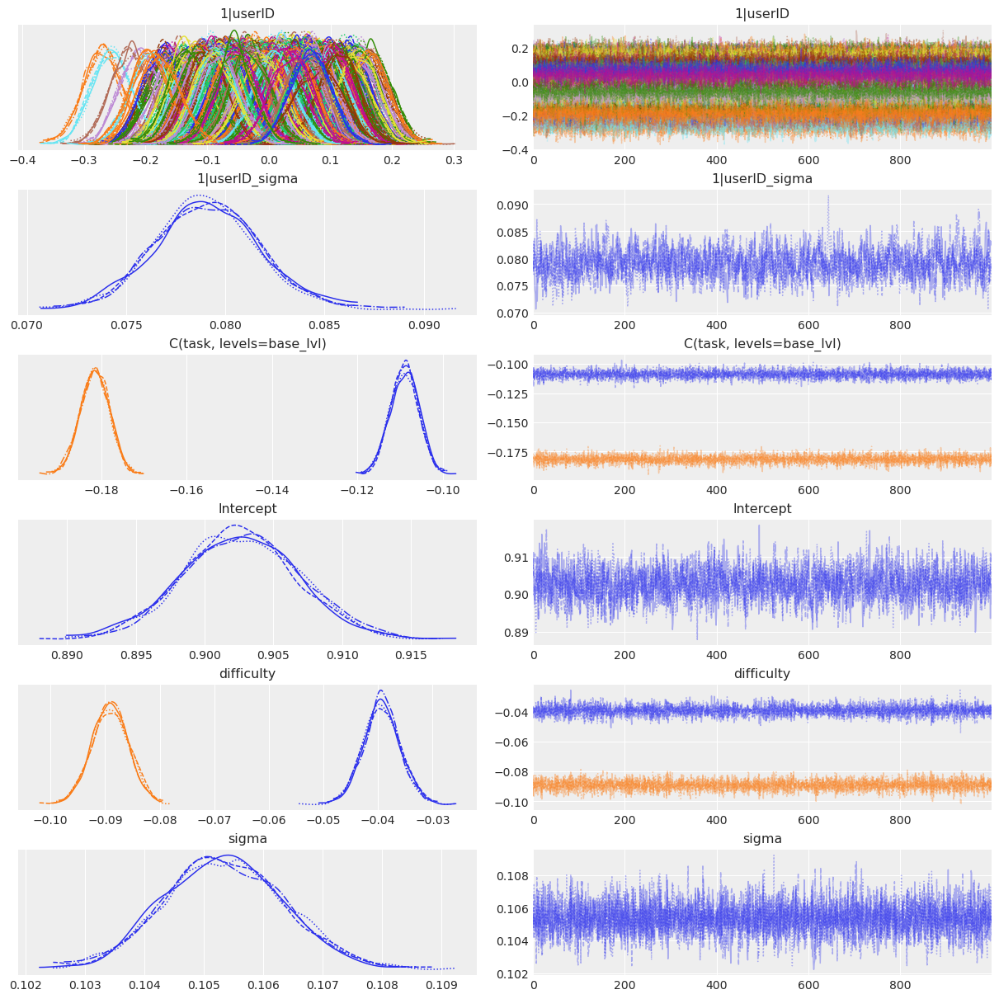

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1]     0.069  0.033   0.009    0.132        0.0    0.000    7046.0   
1|userID[s_10]    0.103  0.032   0.040    0.161        0.0    0.000    7466.0   
1|userID[s_1000]  0.010  0.033  -0.051    0.071        0.0    0.001    7127.0   
1|userID[s_1001]  0.019  0.031  -0.039    0.078        0.0    0.000    7639.0   
1|userID[s_1002] -0.103  0.032  -0.163   -0.044        0.0    0.000    8054.0   
1|userID[s_1004]  0.080  0.033   0.017    0.141        0.0    0.000    8181.0   
1|userID[s_1005]  0.082  0.033   0.020    0.145        0.0    0.000    7280.0   
1|userID[s_1006]  0.028  0.032  -0.033    0.088        0.0    0.000    7306.0   
1|userID[s_1012] -0.033  0.032  -0.091    0.027        0.0    0.000    6719.0   
1|userID[s_1013]  0.146  0.032   0.086    0.209        0.0    0.000    8028.0   
1|userID[s_1014] -0.027  0.031  -0.085    0.031        0.0    0.000    7104.0   
1|userID[s_1015] -0.016  0.0

In [12]:
f = 'concat_datasets_123'

print(f'Dataset: {f}')
for formula in formulas2run:
    print(f'\nFitting formula {formula}\n')
    print_model(model_dic_bernoulli[f][formula], result_dic_bernoulli[f][formula])

### Compare all data
[top](#top)

dataset_1 

                                                    rank     elpd_loo  \
correct_flt ~ C(task, levels=base_lvl) * diffic...     0  1770.143304   
correct_flt ~ C(task, levels=base_lvl) + diffic...     1  1740.239658   

                                                         p_loo  elpd_diff  \
correct_flt ~ C(task, levels=base_lvl) * diffic...  218.877309   0.000000   
correct_flt ~ C(task, levels=base_lvl) + diffic...  213.551806  29.903645   

                                                      weight         se  \
correct_flt ~ C(task, levels=base_lvl) * diffic...  0.886607  34.121275   
correct_flt ~ C(task, levels=base_lvl) + diffic...  0.113393  34.285396   

                                                         dse  warning scale  
correct_flt ~ C(task, levels=base_lvl) * diffic...  0.000000    False   log  
correct_flt ~ C(task, levels=base_lvl) + diffic...  8.807909    False   log  

dataset_2 

                                                    rank     el

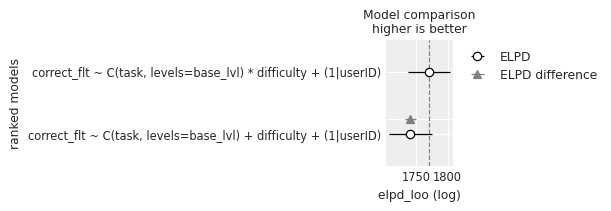

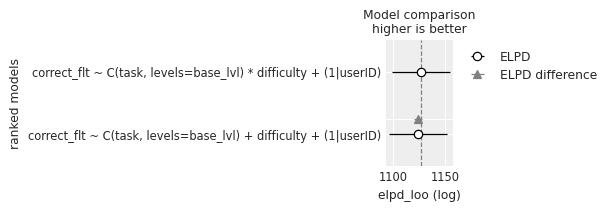

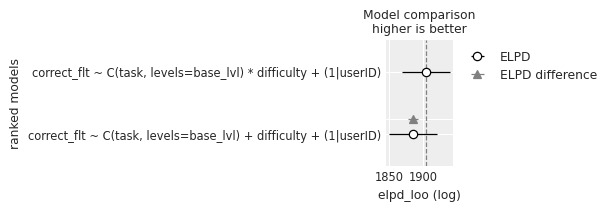

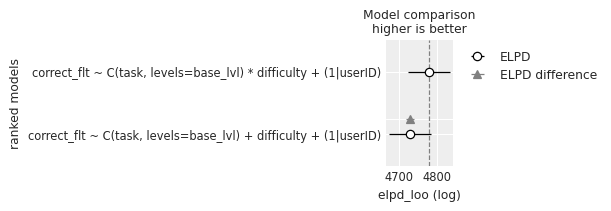

In [13]:
df_compare_formulas_bernoulli = {}
for f in result_dic_bernoulli.keys():
    print(f, '\n')
    df_compare_formulas_bernoulli[f] = az.compare(result_dic_bernoulli[f])
    
    print(df_compare_formulas_bernoulli[f])
    
    az.plot_compare(df_compare_formulas_bernoulli[f], insample_dev=False);

    
    print()
# df_compare_formulas_bernoulli[f]

Text(0.5, 0.98, 'Model comparison\nhigher is better')

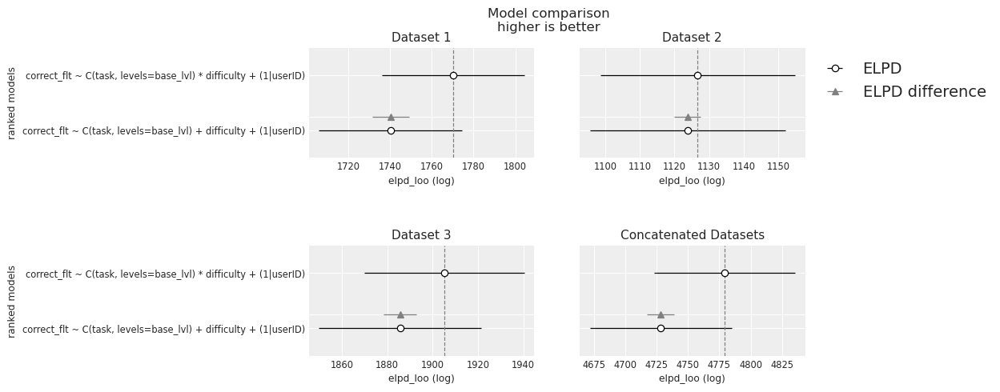

In [14]:
fig, axs = plt.subplots(2,2, figsize=(8,5), sharey=True, constrained_layout=False)
plt.subplots_adjust(hspace=0.8)

for (i,f),ax in zip(enumerate(df_compare_formulas_bernoulli.keys()), axs.flatten()):
    az.plot_compare(df_compare_formulas_bernoulli[f], insample_dev=False, ax=ax)
    
    if i==1:
        ax.legend(bbox_to_anchor=(1,1))
    else:
        ax.legend_.remove()

    if i%2==1:
        ax.set_ylabel('')
        
    t = ax.get_title()
    ax.set_title(f.replace('concat_datasets_123', 'concatenated datasets').replace('_',' ').title(), fontsize=11)
    
plt.suptitle(t)

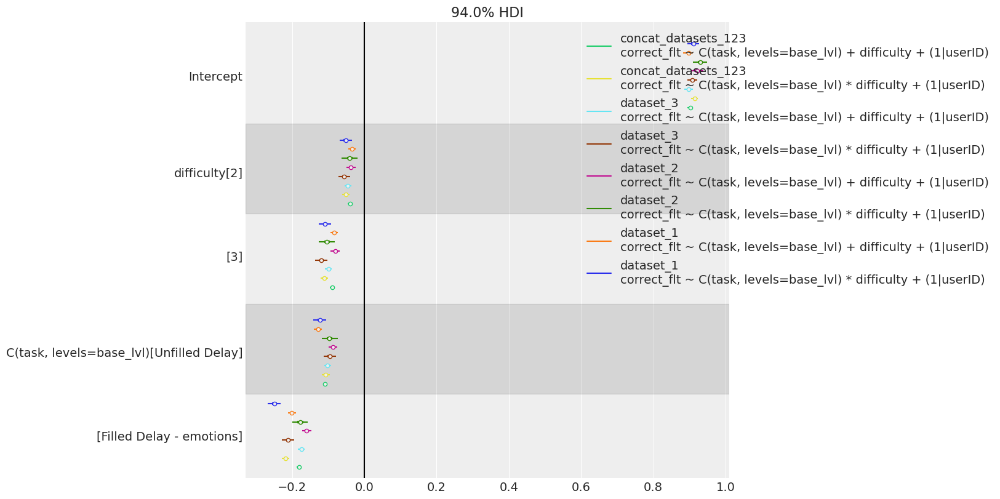

In [15]:
fig, ax = plt.subplots(figsize=(14, 8))

az.plot_forest(
    list(result_dic_bernoulli['dataset_1'].values())+\
    list(result_dic_bernoulli['dataset_2'].values())+\
    list(result_dic_bernoulli['dataset_3'].values())+\
    list(result_dic_bernoulli['concat_datasets_123'].values()),
    model_names=[f'{f}\n{formula}' for f in result_dic_bernoulli.keys() for formula in formulas2run],
    var_names=["Intercept", "difficulty", "C(task, levels=base_lvl)"],
    combined=True,
    ax=ax
)

ax.axvline(0, c='k')

# manually adjust the legend, there is some weird bug
legend = ax.get_legend()
labels = [] if legend is None else [str(x._text) for x in legend.texts]
handles = [] if legend is None else legend.legend_handles
ax.legend(handles, labels, loc="upper right", bbox_to_anchor=(1.56, 1), ncols=1)
# plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust plot area to make space for the legend
plt.show()



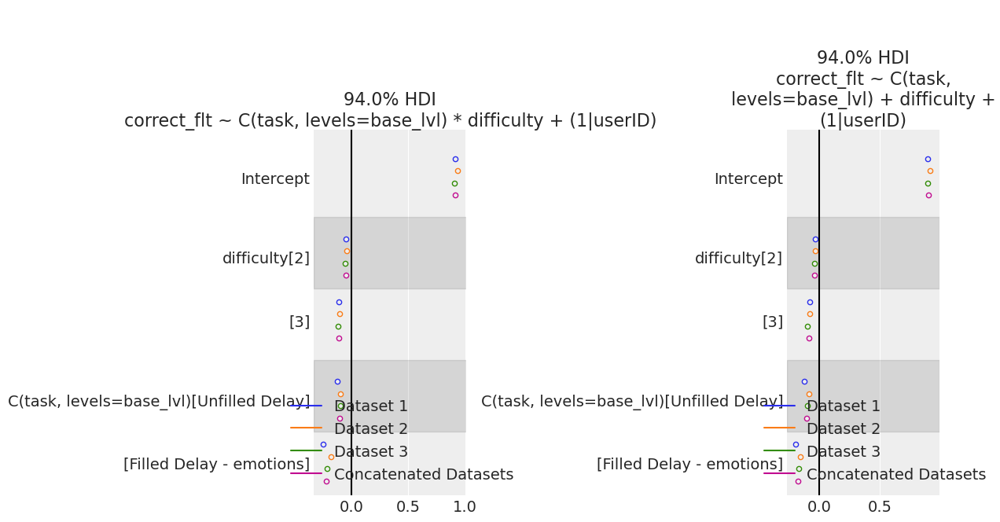

In [16]:
fig, axs = plt.subplots(1,2, figsize=(12, 6))

for i, ax in enumerate(axs.flatten()):

    az.plot_forest(
        (list(result_dic_bernoulli['dataset_1'].values())+\
        list(result_dic_bernoulli['dataset_2'].values())+\
        list(result_dic_bernoulli['dataset_3'].values())+\
        list(result_dic_bernoulli['concat_datasets_123'].values())
    )[i::2],
        model_names=[f'{f}' for f in result_dic_bernoulli.keys()],
        var_names=["Intercept", "difficulty", "C(task, levels=base_lvl)"],
        combined=True,
        ax=ax
    )
        
    ax.set_title(f'{ax.get_title()}\n{formulas2run[i]}')

    ax.axvline(0, c='k')

    # manually adjust the legend, there is some weird bug
    legend = ax.get_legend()
    labels = [] if legend is None else [str(x._text).replace('concat_datasets_123', 'concatenated datasets').replace('_',' ').title() for x in legend.texts]
    handles = [] if legend is None else legend.legend_handles
    # reorder the legend
    ax.legend(handles[::-1], labels[::-1], loc="lower right", bbox_to_anchor=(1.4, 0))
    
    
# plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust plot area to make space for the legend
plt.show()



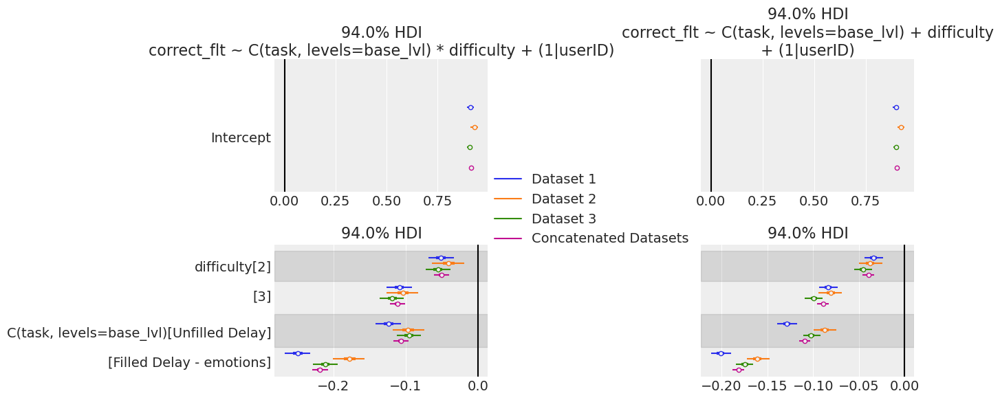

In [17]:
fig, axs = plt.subplots(2, 2, figsize=(12, 6), sharey='row', constrained_layout=False)

plt.subplots_adjust(wspace=1., hspace=0.4)

for i in range(2):

    models = (
        list(result_dic_bernoulli['dataset_1'].values()) +
        list(result_dic_bernoulli['dataset_2'].values()) +
        list(result_dic_bernoulli['dataset_3'].values()) +
        list(result_dic_bernoulli['concat_datasets_123'].values())
    )[i::2]

    # Plot 'Intercept' separately
    az.plot_forest(
        models,  # Only Intercept
        model_names=[f'{f}' for f in result_dic_bernoulli.keys()],
        var_names=["Intercept"],
        combined=True,
        ax=axs[0,i]
    )

    # Plot other variables
    az.plot_forest(
        models,
        model_names=[f'{f}' for f in result_dic_bernoulli.keys()],
        var_names=["difficulty", "C(task, levels=base_lvl)"],
        combined=True,
        ax=axs[1,i]
    )

    axs[0,i].set_title(f'{axs[0,i].get_title()}\n{formulas2run[i]}')
    
    
for i, ax in enumerate(axs.flatten()):
    ax.axvline(0, c='k')
    
    if i==0:
        # Manually adjust the legend
        legend = ax.get_legend()
        labels = [] if legend is None else [str(x._text).replace('concat_datasets_123', 'concatenated datasets').replace('_', ' ').title() for x in legend.texts]
        handles = [] if legend is None else legend.legend_handles
        ax.legend(handles[::-1], labels[::-1], loc="lower right", bbox_to_anchor=(2., -.5))
        
    else:
        ax.legend_.remove()

# # Add title and vertical line to the intercept subplot
# intercept_ax.set_title("Intercept")
# intercept_ax.axvline(0, c='k')

plt.show()


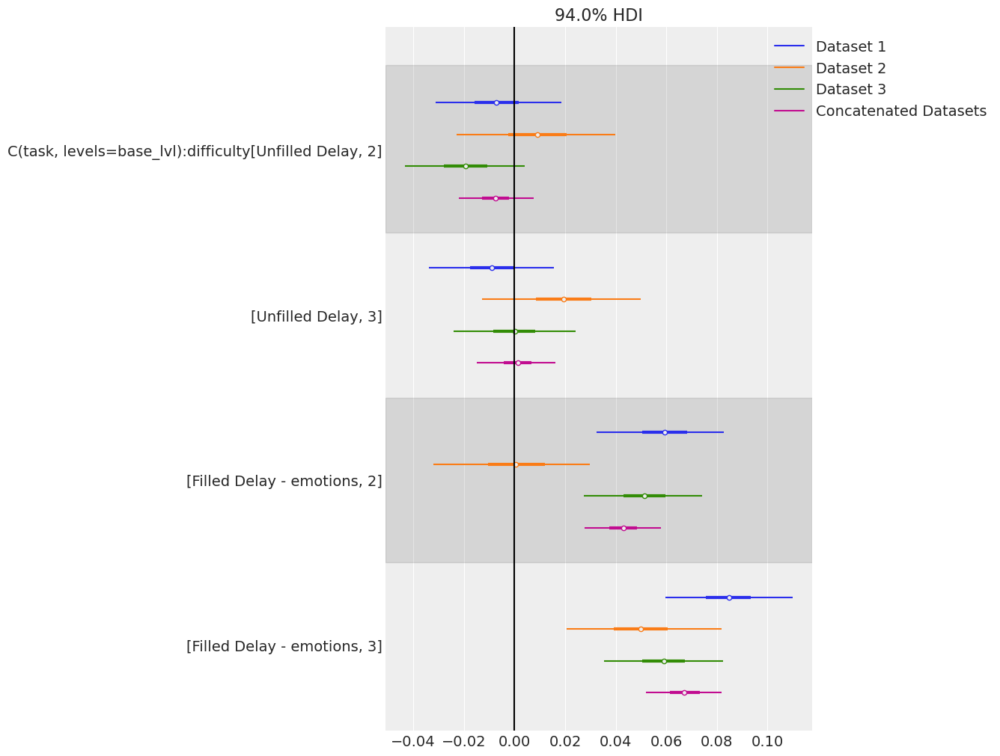

In [18]:

fig, ax = plt.subplots(figsize=(12, 10))


az.plot_forest(
    (list(result_dic_bernoulli['dataset_1'].values())+\
    list(result_dic_bernoulli['dataset_2'].values())+\
    list(result_dic_bernoulli['dataset_3'].values())+\
    list(result_dic_bernoulli['concat_datasets_123'].values())
    )[::2],
    model_names=[f'{f}' for f in result_dic_bernoulli.keys()],
    var_names=["C(task, levels=base_lvl):difficulty"],
    combined=True,
    ax=ax
)

ax.axvline(0, c='k')

# plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
# # plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust plot area to make space for the legend
# plt.show()


# manually adjust the legend, there is some weird bug
legend = ax.get_legend()
labels = [] if legend is None else [str(x._text).replace('concat_datasets_123', 'concatenated datasets').replace('_',' ').title() for x in legend.texts]
handles = [] if legend is None else legend.legend_handles
ax.legend(handles[::-1], labels[::-1], loc="upper right", bbox_to_anchor=(1.44, 1))
# plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust plot area to make space for the legend
plt.show()

### Run some predictions
[top](#top)

In [19]:
interactions = ['Unfilled Delay, 2', 'Unfilled Delay, 3', 'Filled Delay - emotions, 2', 'Filled Delay - emotions, 3']
d2, d3, i2, i3 = [result_dic_bernoulli[f]['correct_flt ~ C(task, levels=base_lvl) * difficulty + (1|userID)'].posterior["C(task, levels=base_lvl):difficulty"].sel({"C(task, levels=base_lvl):difficulty_dim":tsk}) for tsk in interactions]



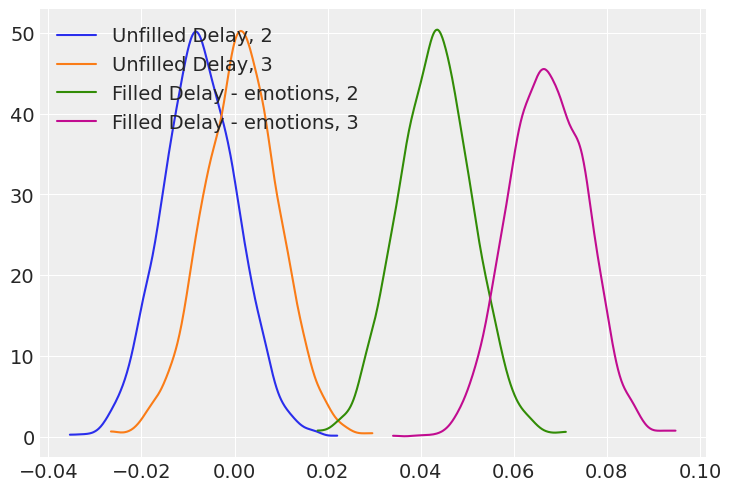

In [20]:
_, ax = plt.subplots()
for idx, x in enumerate([d2, d3, i2, i3]):
    az.plot_dist(x, label=x["C(task, levels=base_lvl):difficulty_dim"].item(), plot_kwargs={"color": f"C{idx}"}, ax=ax)
ax.legend(loc="upper left");

In [21]:
# Probability that the FM slope is less than 0

print(f"""
Probability that the UD slope is less than 0:
level 2: {(d2 < 0).mean().item()}
level 3: {(d3 < 0).mean().item()}
""")


Probability that the UD slope is less than 0:
level 2: 0.82675
level 3: 0.42775



---

In [22]:
for f in result_dic_bernoulli.keys():

    d2, d3, i2, i3 = [result_dic_bernoulli[f]['correct_flt ~ C(task, levels=base_lvl) * difficulty + (1|userID)'].posterior["C(task, levels=base_lvl):difficulty"].sel({"C(task, levels=base_lvl):difficulty_dim":tsk}) for tsk in interactions]
    print(f"""
Experiment {f}:
  Probability that the UD slope is less than 0:
    level 2: {(d2 < 0).mean().item()}
    level 3: {(d3 < 0).mean().item()}
    
  Probability that the FD-e slope is less than 0:
    level 2: {(i2 < 0).mean().item()}
    level 3: {(i3 < 0).mean().item()}
    
    """)


Experiment dataset_1:
  Probability that the UD slope is less than 0:
    level 2: 0.70875
    level 3: 0.7535
    
  Probability that the FD-e slope is less than 0:
    level 2: 0.0
    level 3: 0.0
    
    

Experiment dataset_2:
  Probability that the UD slope is less than 0:
    level 2: 0.2895
    level 3: 0.1185
    
  Probability that the FD-e slope is less than 0:
    level 2: 0.486
    level 3: 0.001
    
    

Experiment dataset_3:
  Probability that the UD slope is less than 0:
    level 2: 0.93425
    level 3: 0.4945
    
  Probability that the FD-e slope is less than 0:
    level 2: 0.0
    level 3: 0.0
    
    

Experiment concat_datasets_123:
  Probability that the UD slope is less than 0:
    level 2: 0.82675
    level 3: 0.42775
    
  Probability that the FD-e slope is less than 0:
    level 2: 0.0
    level 3: 0.0
    
    


### Save the inference
[top](#top)

It could be possible to use this:
```
result_dic_bernoulli['dataset_1']['correct_flt ~ task * difficulty + (1|userID)'].to_netcdf()
```

and the other datasets that were fitted, but it doesn't preserve the dictionary, so I use pickle.

In [23]:
# save the dictionary to a pickle file
with open(opj(path_inference_data,'FMP_Figure_2_baselineFM_inference_data_dict.pkl'), 'wb') as f:
    pickle.dump(result_dic_bernoulli, f)

In [24]:
# # Load the dictionary from the pickle file
# with open(opj(path_inference_data,'FMP_Figure_2_inference_data_dict.pkl'), 'rb') as f:
#     loaded_inference_data_dict = pickle.load(f)


In [25]:
%load_ext watermark

%watermark -a 'Jan Kadlec' -nmvu -iv -iv -w -p pytensor


Author: Jan Kadlec

Last updated: Fri May 16 2025

Python implementation: CPython
Python version       : 3.12.5
IPython version      : 8.25.0

pytensor: 2.23.0

Compiler    : GCC 12.4.0
OS          : Linux
Release     : 5.14.0-427.42.1.el9_4.x86_64
Machine     : x86_64
Processor   : x86_64
CPU cores   : 96
Architecture: 64bit

numpy     : 1.26.4
bambi     : 0.14.0
matplotlib: 3.9.2
sys       : 3.12.5 | packaged by conda-forge | (main, Aug  8 2024, 18:36:51) [GCC 12.4.0]
arviz     : 0.19.0
pandas    : 2.2.2

Watermark: 2.4.3



[top](#top)